In [13]:
from calendar import month, week
from datetime import timedelta, datetime
from tkinter import NS
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
from main import calculate_derivative
from utils.payoff_function import calculate_option_price,calculate_r, get_payoff_pmh
from utils.evaluation import evaluate_option_price
from utils.simulation_function import SimMultiGBMAV,SimMultiGBM, SimMultiGBMpmh
from utils.extract_data_function import extract_data
from utils.counting_days_function import days
from utils.ems_correction import EMSCorrection
from utils.calculate_implied_volatility import cov_actual_IV,cov_estimated_IV
from dateutil.relativedelta import relativedelta
import json
import math
import warnings
import seaborn as sns
warnings.filterwarnings("ignore")

# Empirical Martingale Correction

In [17]:
def calculate_derivative(experiment_details):

    date_to_predict, hist_end, end_date, q2_to_maturity, q3_to_maturity, q2, q3, total_trading_days, alternative_option_ttm, holidays = days(
        latest_price_date=experiment_details['latest_price_date'])

    print(f"date_to_predict: {date_to_predict}")
    print(f"hist_end: {hist_end}")
    print(f"end_date: {end_date}")
    print(f"q2_to_maturity: {q2_to_maturity}")
    print(f"q3_to_maturity: {q3_to_maturity}")
    print(f"q2: {q2}")
    print(f"q3: {q3}")
    print(f"total_trading_days: {total_trading_days}")
    print(f"holidays: {holidays}")
    trading_days_to_simulate = total_trading_days

    if experiment_details['estimated_IV']:
        aapl_call_df = pd.read_csv('../Bloomberg_Data/aapl_call.csv')
        aapl_call_df['Date'] = pd.to_datetime(aapl_call_df['Date'])
        amzn_call_df = pd.read_csv('../Bloomberg_Data/amzn_call.csv')
        amzn_call_df['Date'] = pd.to_datetime(amzn_call_df['Date'])
        googl_call_df = pd.read_csv('../Bloomberg_Data/googl_call.csv')
        googl_call_df['Date'] = pd.to_datetime(googl_call_df['Date'])

        min_sigma = experiment_details['min_sigma']
        max_sigma = experiment_details['max_sigma']
        step = experiment_details['step']
        sigma_hat_list = np.arange(min_sigma, max_sigma + step, step)
        right = len(sigma_hat_list) - 1
        left = 0

    if experiment_details['actual_IV']:
        aapl_IV_df = pd.read_csv('../Bloomberg_Data/aapl_IV.csv')
        aapl_IV_df['Date'] = pd.to_datetime(aapl_IV_df['Date'], format='%Y-%m-%d')
        amzn_IV_df = pd.read_csv('../Bloomberg_Data/amzn_IV.csv')
        amzn_IV_df['Date'] = pd.to_datetime(amzn_IV_df['Date'], format='%Y-%m-%d')
        googl_IV_df = pd.read_csv('../Bloomberg_Data/googl_IV.csv')
        googl_IV_df['Date'] = pd.to_datetime(googl_IV_df['Date'], format='%Y-%m-%d')

    if 'r' not in experiment_details:
        rates = pd.read_csv('../data/04-11-2022/USTREASURY-YIELD_04_11_22.csv')
        rates['Date'] = pd.to_datetime(rates['Date'], format='%Y-%m-%d')
        rates = rates.set_index('Date')
        rates = rates.asfreq('D')
        rates = rates.ffill()
    else:
        rates = None

    predicted_option_price = []
    predicted_option_price_emc = []
    expected_payoff_list = []
    expected_payoff_list_emc = []
    delta_aapl = []
    delta_amzn = []
    delta_googl = []
    gamma_aapl = []
    gamma_amzn = []
    gamma_googl = []
    r_list = []
    r_list_emc = []
    v_aapl = []
    v_amzn = []
    v_googl = []
    sigma_aapl = []
    sigma_amzn = []
    sigma_googl = []
    aapl_before_emc = []
    amzn_before_emc = []
    googl_before_emc = []
    prediction_dates = []


    while date_to_predict <= end_date:
        prediction_dates.append(date_to_predict)
        if datetime.strftime(date_to_predict,
                             "%Y-%m-%d") in holidays or date_to_predict.weekday() == 5 or date_to_predict.weekday() == 6:
            date_to_predict += relativedelta(days=+1)
            hist_end += relativedelta(days=+1)
            continue

        hist_start = hist_end - timedelta(days=experiment_details['window_length'])

        aapl = extract_data('../data/04-11-2022/aapl_04_11_2022.csv', hist_start, hist_end).rename(
            columns={'Close/Last': 'AAPL'})
        amzn = extract_data('../data/04-11-2022/amzn_04_11_2022.csv', hist_start, hist_end).rename(
            columns={'Close/Last': 'AMZN'})
        googl = extract_data('../data/04-11-2022/googl_04_11_2022.csv', hist_start, hist_end).rename(
            columns={'Close/Last': 'GOOGL'})
        temp_df = aapl.merge(amzn, on=['Date'])
        AAG = temp_df.merge(googl, on=['Date']).drop(columns=['Unnamed: 0'])
        n0 = len(AAG)
        AAGprices = np.array(AAG.drop(columns=['Date']))
        AAGlogprices = np.log(AAGprices)
        AAGlogreturns = AAGlogprices[:n0 - 1, :] - AAGlogprices[1:, :]

        # v = np.mean(AAGlogreturns, axis=0)
        # v_aapl.append(v[0])
        # v_amzn.append(v[1])
        # v_googl.append(v[2])
        Nsim = experiment_details['Nsim']
        T = trading_days_to_simulate
        dt = 1
        m = int(T / dt)
        r = experiment_details['r'] if 'r' in experiment_details else calculate_r(0, date_to_predict,
                                                                                  interpolate_r=False, rates=rates)

        # If IV setting is true covariance matrix is calculated from implied volatility of individual stocks  options market price
        if experiment_details['estimated_IV']:
            sigma = cov_estimated_IV(aapl_call_df, amzn_call_df, googl_call_df, r, alternative_option_ttm,
                                     sigma_hat_list, left, right, date_to_predict, AAGlogreturns)

        elif experiment_details['actual_IV']:
            sigma = cov_actual_IV(aapl_IV_df, amzn_IV_df, googl_IV_df, date_to_predict, AAGlogreturns)

        else:
            sigma = np.cov(AAGlogreturns, rowvar=False)

        sigma_aapl.append(np.sqrt(sigma.diagonal())[0])
        sigma_amzn.append(np.sqrt(sigma.diagonal())[1])
        sigma_googl.append(np.sqrt(sigma.diagonal())[2])

        v = r/total_trading_days - sigma.diagonal()/2
        v_aapl.append(v[0])
        v_amzn.append(v[1])
        v_googl.append(v[2])

        print(f"trading_days_to_simulate: {trading_days_to_simulate}")

        S0 = AAGprices[0, :]
        sim_aapl = []
        sim_aapl_mh = []
        sim_aapl_ph = []
        sim_amzn = []
        sim_amzn_mh = []
        sim_amzn_ph = []
        sim_googl = []
        sim_googl_mh = []
        sim_googl_ph = []


        # Antithetic Variate reduction technique is applied if Variance Reduction is set to true
        if experiment_details['variance_reduction']:
            for i in range(1, int(Nsim / 2) + 1):
                S, Stilde, Z = SimMultiGBMAV(S0, v, sigma, dt, T)
                sim_aapl.append(S[0])
                sim_aapl.append(Stilde[0])
                sim_amzn.append(S[1])
                sim_amzn.append(Stilde[1])
                sim_googl.append(S[2])
                sim_googl.append(Stilde[2])
                if experiment_details['delta_gamma']:
                    S_pmh, Stilde_pmh = SimMultiGBMpmh(S0, v, sigma, dt, T, Z, variance_reduction=True,
                                                       h_prop=experiment_details['h_prop'])
                    sim_aapl_mh.append(S_pmh[0])
                    sim_aapl_mh.append(Stilde_pmh[0])
                    sim_aapl_ph.append(S_pmh[2])
                    sim_aapl_ph.append(Stilde_pmh[2])
                    sim_amzn_mh.append(S_pmh[3])
                    sim_amzn_mh.append(Stilde_pmh[3])
                    sim_amzn_ph.append(S_pmh[5])
                    sim_amzn_ph.append(Stilde_pmh[5])
                    sim_googl_mh.append(S_pmh[6])
                    sim_googl_mh.append(Stilde_pmh[6])
                    sim_googl_ph.append(S_pmh[8])
                    sim_googl_ph.append(Stilde_pmh[8])

        else:
            for i in range(1, Nsim + 1):
                S, Z = SimMultiGBM(S0, v, sigma, dt, T)
                sim_aapl.append(S[0])
                sim_amzn.append(S[1])
                sim_googl.append(S[2])
                if experiment_details['delta_gamma']:
                    S_pmh = SimMultiGBMpmh(S0, v, sigma, dt, T, Z, variance_reduction=False,
                                           h_prop=experiment_details['h_prop'])
                    sim_aapl_mh.append(S_pmh[0])
                    sim_aapl_ph.append(S_pmh[2])
                    sim_amzn_mh.append(S_pmh[3])
                    sim_amzn_ph.append(S_pmh[5])
                    sim_googl_mh.append(S_pmh[6])
                    sim_googl_ph.append(S_pmh[8])

        aapl_before_emc = sim_aapl
        amzn_before_emc = sim_amzn
        googl_before_emc = sim_googl

        sim_aapl_emc = EMSCorrection(sim_aapl, Nsim, r, dt, T)
        sim_amzn_emc = EMSCorrection(sim_amzn, Nsim, r, dt, T)
        sim_googl_emc = EMSCorrection(sim_googl, Nsim, r, dt, T)
        if experiment_details['delta_gamma']:
            sim_aapl_mh = EMSCorrection(sim_aapl_mh, Nsim, r, dt, T)
            sim_aapl_ph = EMSCorrection(sim_aapl_ph, Nsim, r, dt, T)
            sim_amzn_mh = EMSCorrection(sim_amzn_mh, Nsim, r, dt, T)
            sim_amzn_ph = EMSCorrection(sim_amzn_ph, Nsim, r, dt, T)
            sim_googl_mh = EMSCorrection(sim_googl_mh, Nsim, r, dt, T)
            sim_googl_ph = EMSCorrection(sim_googl_ph, Nsim, r, dt, T)

        q2_index = total_trading_days - q2_to_maturity if total_trading_days - q2_to_maturity >= 0 else None
        q3_index = total_trading_days - q3_to_maturity if total_trading_days - q3_to_maturity >= 0 else None

        option_prices = []
        option_prices_emc = []
        payoff_list = []
        payoff_list_emc = []
        delta_payoff_pmh = []
        gamma_payoff_pmh = []
        for i in range(Nsim):
            option_price, payoff, r = calculate_option_price(
                aapl=sim_aapl[i],
                amzn=sim_amzn[i],
                googl=sim_googl[i],
                T=trading_days_to_simulate,
                total_trading_days=total_trading_days,
                q2_index=q2_index,
                q3_index=q3_index,
                q2=q2,
                q3=q3,
                maturity=datetime.strptime('2023-08-22', "%Y-%m-%d"),
                cur=date_to_predict,
                interpolate_r=experiment_details['interpolate_r'],
                r=experiment_details['r'] if 'r' in experiment_details else None,
                rates=rates
            )

            option_price_emc, payoff_emc, r_emc = calculate_option_price(
                aapl=sim_aapl_emc[i],
                amzn=sim_amzn_emc[i],
                googl=sim_googl_emc[i],
                T=trading_days_to_simulate,
                total_trading_days=total_trading_days,
                q2_index=q2_index,
                q3_index=q3_index,
                q2=q2,
                q3=q3,
                maturity=datetime.strptime('2023-08-22', "%Y-%m-%d"),
                cur=date_to_predict,
                interpolate_r=experiment_details['interpolate_r'],
                r=experiment_details['r'] if 'r' in experiment_details else None,
                rates=rates
            )
            r_list_emc.append(r_emc)
            r_list.append(r)
            option_prices.append(
                option_price
            )
            option_prices_emc.append(option_price_emc)
            payoff_list.append(payoff)
            payoff_list_emc.append(payoff_emc)
            if experiment_details['delta_gamma']:
                delta_payoff_pmh_, gamma_payoff_pmh_ = get_payoff_pmh(S0, sim_aapl_mh[i], sim_aapl[i], sim_aapl_ph[i],
                                                                      sim_amzn_mh[i], sim_amzn[i], sim_amzn_ph[i],
                                                                      sim_googl_mh[i],
                                                                      sim_googl[i], sim_googl_ph[i],
                                                                      trading_days_to_simulate=trading_days_to_simulate,
                                                                      total_trading_days=total_trading_days,
                                                                      r=experiment_details[
                                                                          'r'] if 'r' in experiment_details else None,
                                                                      q2_index=q2_index, q3_index=q3_index,
                                                                      q2=q2, q3=q3,
                                                                      interpolate_r=experiment_details['interpolate_r'],
                                                                      h_prop=experiment_details['h_prop'],
                                                                      maturity=datetime.strptime('2023-08-22', "%Y-%m-%d"),
                                                                      cur=date_to_predict,
                                                                      rates=rates)
                delta_payoff_pmh.append(delta_payoff_pmh_)
                gamma_payoff_pmh.append(gamma_payoff_pmh_)

        expected_payoff_list.append(np.mean(payoff_list))
        expected_payoff_list_emc.append(np.mean(payoff_list_emc))
        option_price_emc = np.mean(option_prices_emc)
        option_price = np.mean(option_prices)
        predicted_option_price.append({'date': date_to_predict, 'predicted': option_price})
        predicted_option_price_emc.append({'date': date_to_predict, 'predicted': option_price_emc})
        print(f"Derivative Price for {date_to_predict}")

        if experiment_details['delta_gamma']:
            delta_payoff_pmh = np.transpose(delta_payoff_pmh)
            gamma_payoff_pmh = np.transpose(gamma_payoff_pmh)

            delta_aapl.append(np.mean(delta_payoff_pmh[0]))
            delta_amzn.append(np.mean(delta_payoff_pmh[1]))
            delta_googl.append(np.mean(delta_payoff_pmh[2]))
            gamma_aapl.append(np.mean(gamma_payoff_pmh[0]))
            gamma_amzn.append(np.mean(gamma_payoff_pmh[1]))
            gamma_googl.append(np.mean(gamma_payoff_pmh[2]))

        date_to_predict += relativedelta(days=+1)
        trading_days_to_simulate -= 1
        hist_end += relativedelta(days=+1)
        alternative_option_ttm -= 1

    predicted_option_price = pd.DataFrame(predicted_option_price)
    predicted_option_price_emc = pd.DataFrame(predicted_option_price_emc)
    predicted_option_price['date'] = pd.to_datetime(predicted_option_price['date'])
    # Scale back to 100%
    predicted_option_price['predicted'] = predicted_option_price['predicted'] / 10
    predicted_option_price_emc['predicted'] = predicted_option_price_emc['predicted'] / 10
    actual_option_price = pd.read_csv('../data/04-11-2022/derivative_04_11_2022.csv')
    actual_option_price_2 = actual_option_price
    actual_option_price_2['date'] = pd.to_datetime(actual_option_price_2['date'], format='%Y-%m-%d')
    actual_option_price['date'] = pd.to_datetime(actual_option_price['date'], format='%Y-%m-%d')
    combined = predicted_option_price.merge(actual_option_price, left_on=['date'], right_on=['date'],
                                            validate='one_to_one')
    combined_2 = predicted_option_price_emc.merge(actual_option_price_2, left_on=['date'], right_on=['date'],
                                            validate='one_to_one')                                    
    combined = combined.set_index('date')
    combined_2 = combined_2.set_index('date')

    evaluate_option_price(combined['predicted'], combined['value'], expected_payoff_list, experiment_details,
                          delta_aapl, delta_amzn, delta_googl, gamma_aapl, gamma_amzn, gamma_googl)

    evaluate_option_price(combined_2['predicted'], combined_2['value'], expected_payoff_list_emc, experiment_details,
                          delta_aapl, delta_amzn, delta_googl, gamma_aapl, gamma_amzn, gamma_googl)
    results = {
        'sim_aapl': sim_aapl,
        'sim_amzn': sim_amzn,
        'sim_googl': sim_googl,
        'actual_derivative': combined['value'],
        'sim_derivative': combined['predicted'],
        'sim_derivative_emc': combined_2['predicted'],
        'delta_aapl': delta_aapl,
        'delta_amzn': delta_amzn,
        'delta_googl': delta_googl,
        'gamma_aapl': gamma_aapl,
        'gamma_amzn': gamma_amzn,
        'gamma_googl': gamma_googl,
        'r': r if 'r' in experiment_details else r_list,
        'v_aapl': v_aapl,
        'v_amzn': v_amzn,
        'v_googl': v_googl,
        'sigma_aapl': sigma_aapl,
        'sigma_amzn': sigma_amzn,
        'sigma_googl': sigma_googl,
        'prediction_dates': prediction_dates
    }

    if experiment_details['EMS']:
        results['aapl_before_emc'] = aapl_before_emc
        results['amzn_before_emc'] = amzn_before_emc
        results['googl_before_emc'] = googl_before_emc

    return results


date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
trading_days_to_simulate: 247
Derivative Price for 2022-08-30 00:00:00
trading_days_to_simulate: 246
Derivative Price for 2022-08-31 00:00:00
trading_days_to_

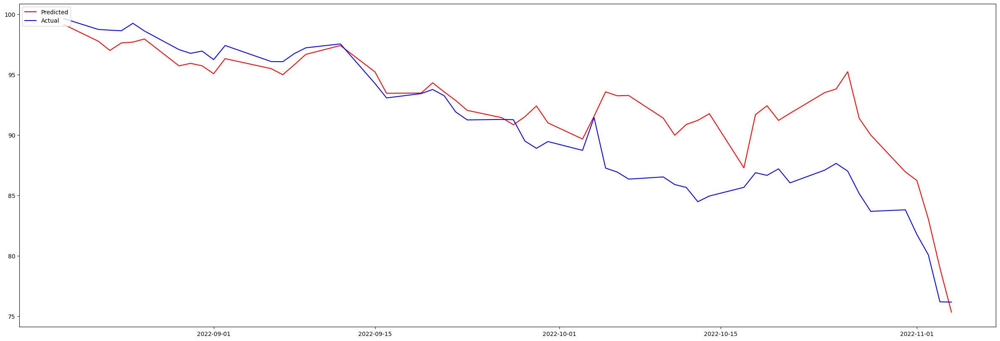

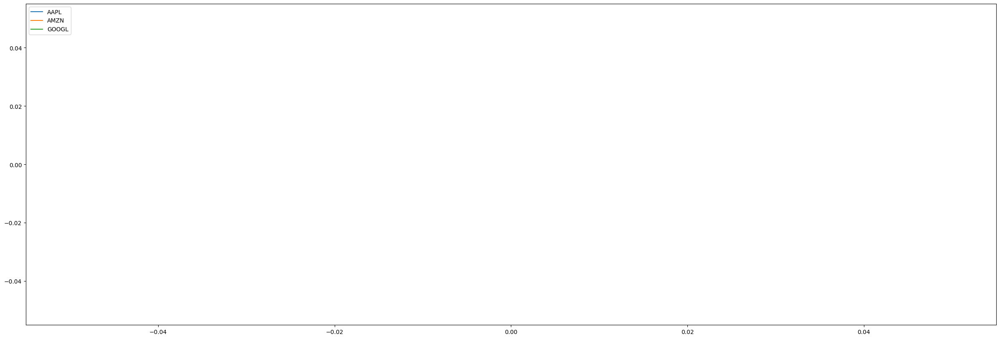

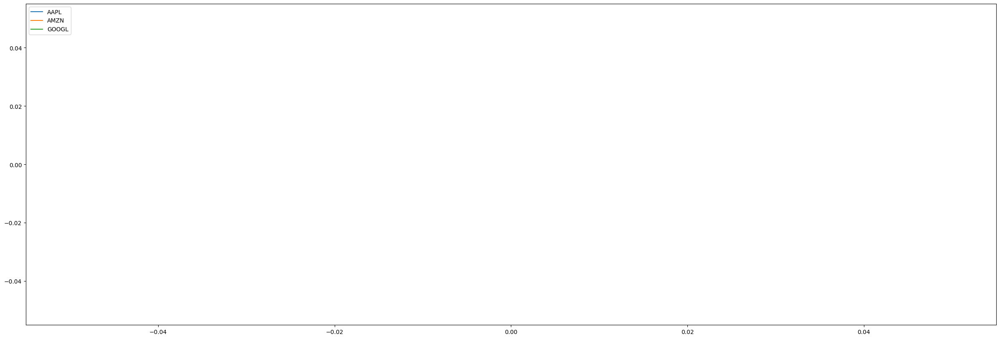

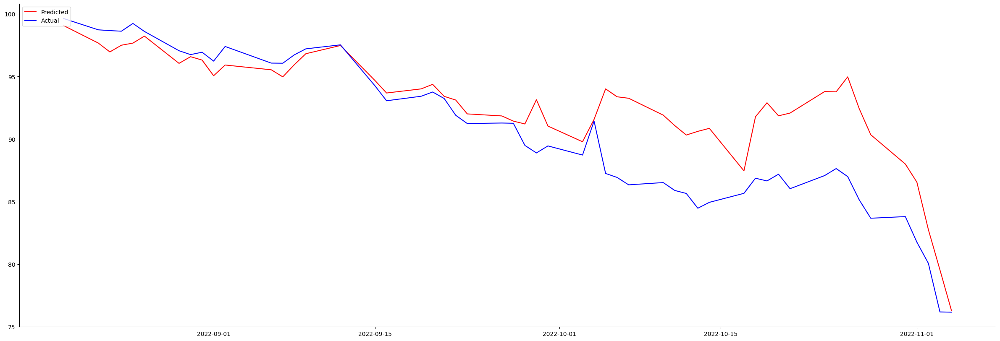

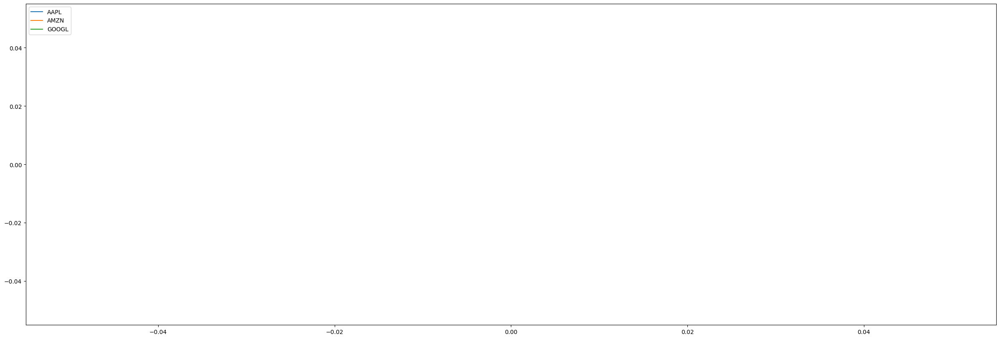

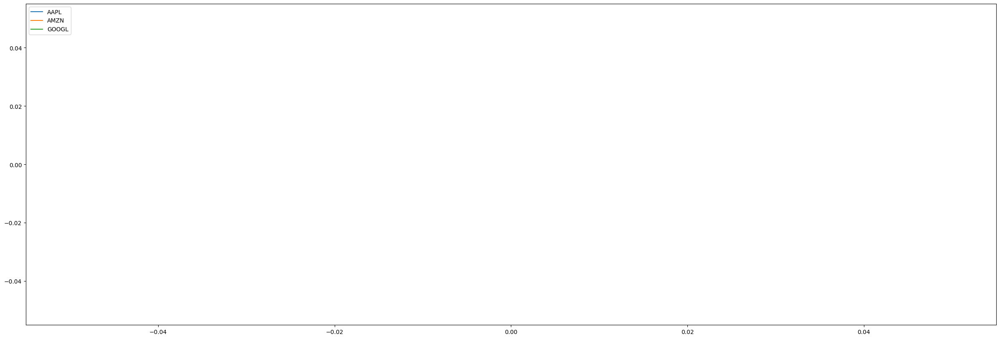

In [18]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 365,
    'latest_price_date': '2022-11-04',
    'variance_reduction': False,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':False,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':False,
    'delta_gamma': False,
    'h_prop': 0.001
}

results = calculate_derivative(experiment_details)

In [30]:
EMC_price = results['sim_derivative_emc']
actual_price = results['actual_derivative']
mc_aapl =results['sim_aapl']

## MC Simulation vs MC Simulation with EMC

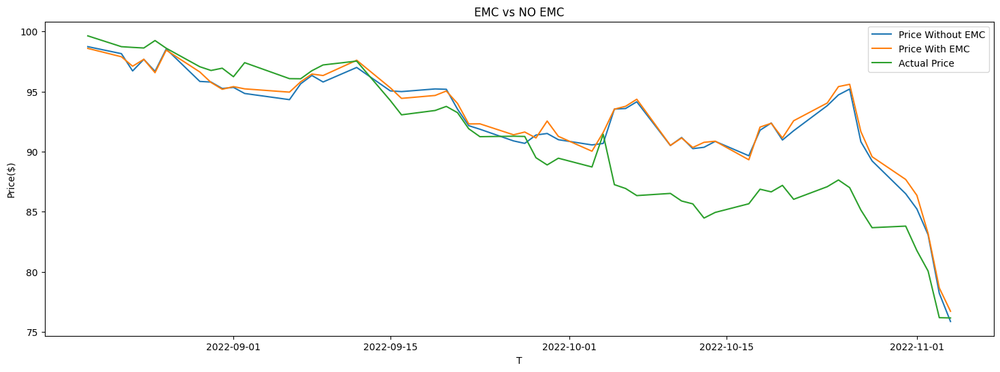

In [7]:
fig = plt.figure(figsize=(18,6))
plt.plot(results['sim_derivative'],label='Price Without EMC')
plt.plot(results['sim_derivative_emc'],label='Price With EMC')
plt.plot(results['actual_derivative'],label='Actual Price')
plt.title('EMC vs NO EMC')
plt.legend(loc='upper right')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/EMC')

### AAPL Before and After EMC

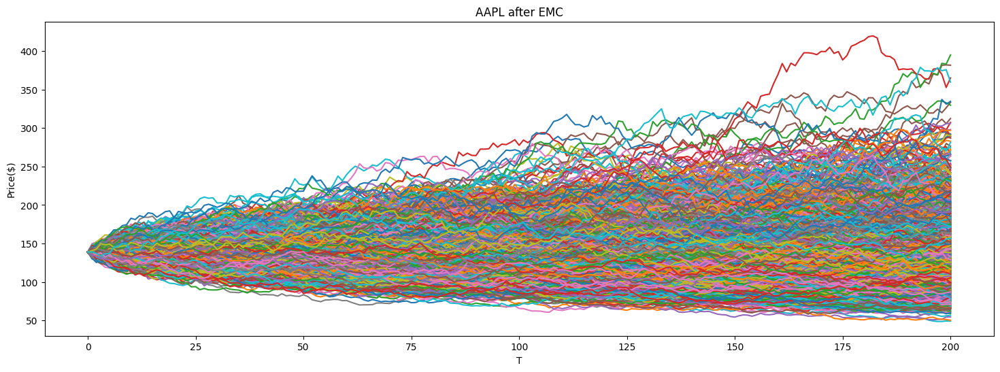

In [8]:
fig = plt.figure(figsize=(18,6))
for i in results['sim_aapl']:
    plt.plot(i)
plt.title('AAPL after EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/AAPL_after_EMC')

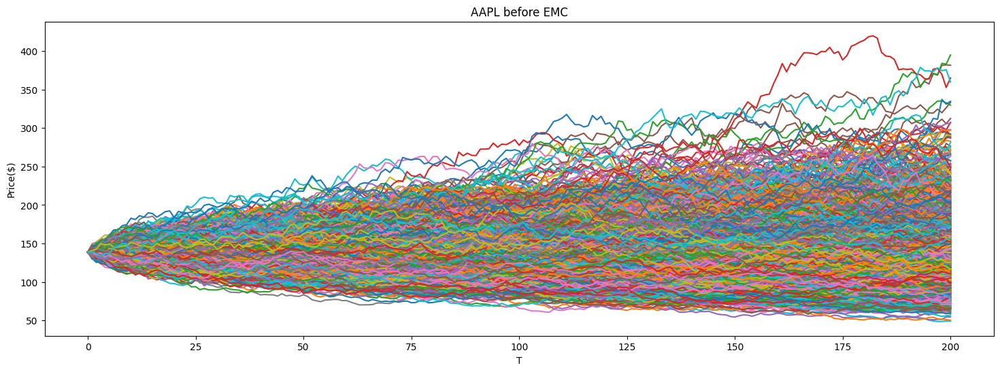

In [9]:
fig = plt.figure(figsize=(18,6))
for i in results['aapl_before_emc']:
    plt.plot(i, label='Before EMC')
plt.title('AAPL before EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/AAPL_before_EMC')

### AMZN Before and After EMC

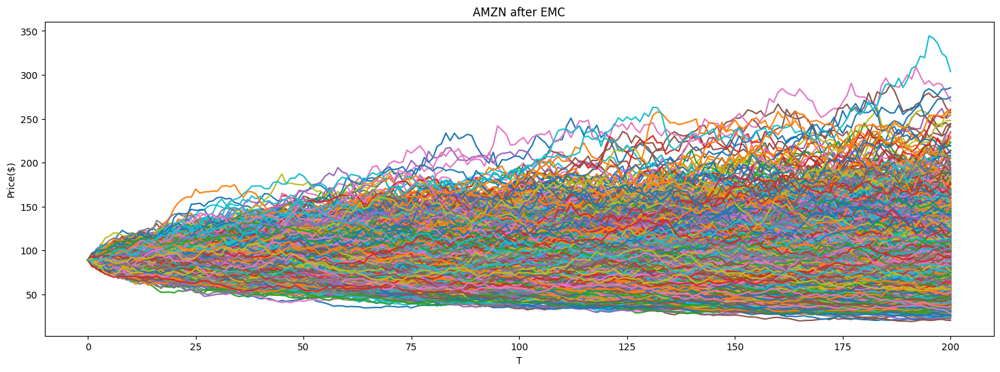

In [10]:
fig = plt.figure(figsize=(18,6))
for i in results['sim_amzn']:
    plt.plot(i)
plt.title('AMZN after EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/AMZN_after_EMC')

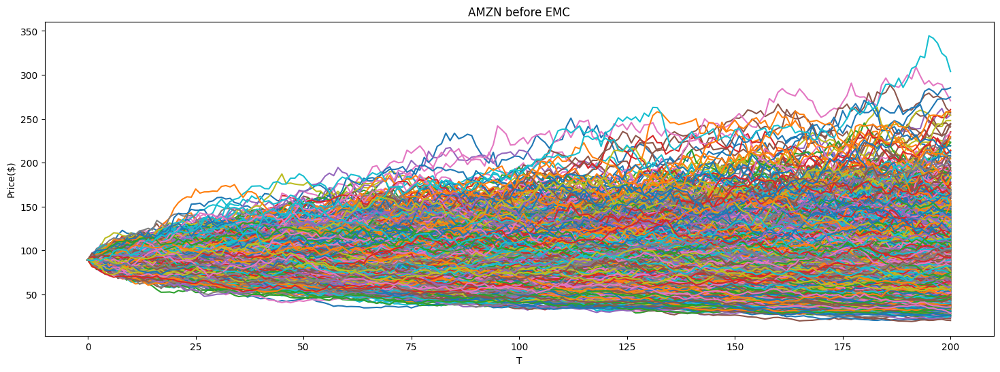

In [11]:
fig = plt.figure(figsize=(18,6))
for i in results['amzn_before_emc']:
    plt.plot(i)
plt.title('AMZN before EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/AMZN_before_EMC')

### GOOGL Before and After EMC

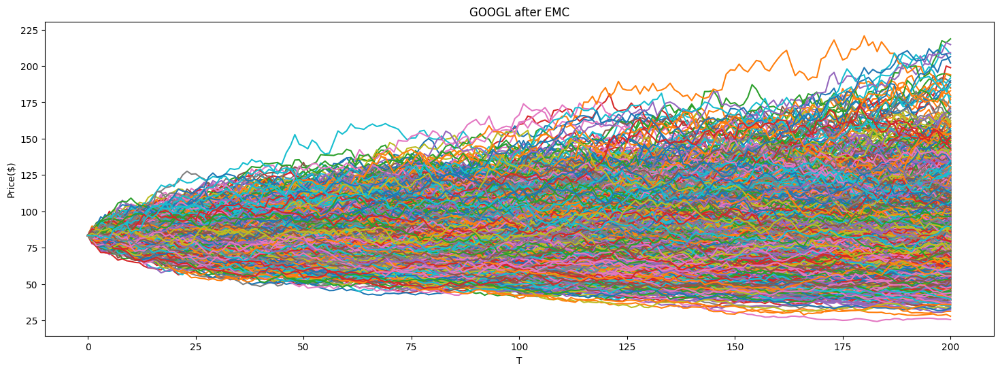

In [12]:
fig = plt.figure(figsize=(18,6))
for i in results['sim_googl']:
    plt.plot(i)
plt.title('GOOGL after EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/GOOGL_after_EMC')

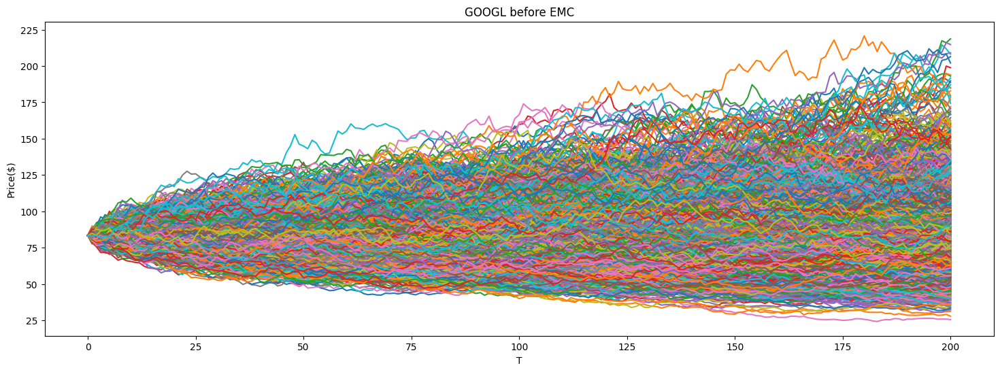

In [13]:
fig = plt.figure(figsize=(18,6))
for i in results['googl_before_emc']:
    plt.plot(i)
plt.title('GOOGL before EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/GOOGL_before_EMC')

### Visualising effect of EMC on a single path

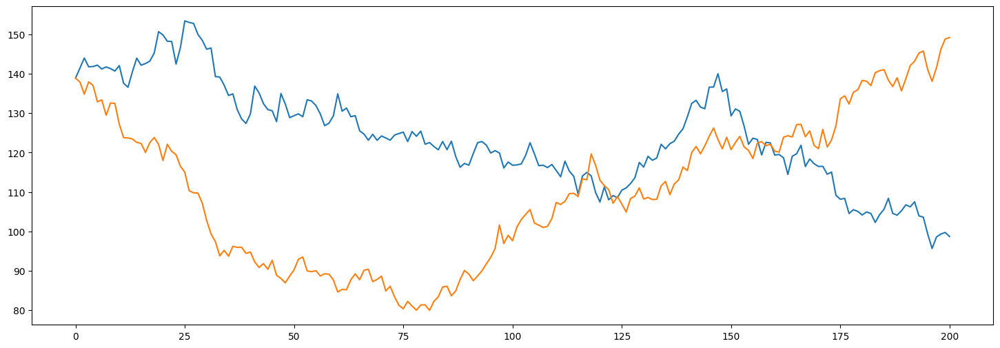

In [15]:
plt.figure(figsize=(18,6))
plt.plot(results['sim_aapl'][np.random.randint(0,2000)])
plt.plot(results['aapl_before_emc'][np.random.randint(0,2000)])


# Antithetic Variance Reduction Technique

## Variance Reduction Experiment

### Expected Payoff of MC Simulations

In [54]:
with open('../results/variance_reduction_experiment/mc_var.json', 'r') as f:
    mc_var = json.load(f)

In [55]:
mc_var_dict = []

for n_sim in mc_var.keys():
    values = mc_var[n_sim]
    for val in values:
        mc_var_dict.append({'n_sims': n_sim, 'payoff': val})

In [56]:
mc_var_df = pd.DataFrame(mc_var_dict)
mc_var_df['n_sims'] = mc_var_df['n_sims'].astype('int')
mc_var_df.sort_values('n_sims',ascending=True,inplace=True)

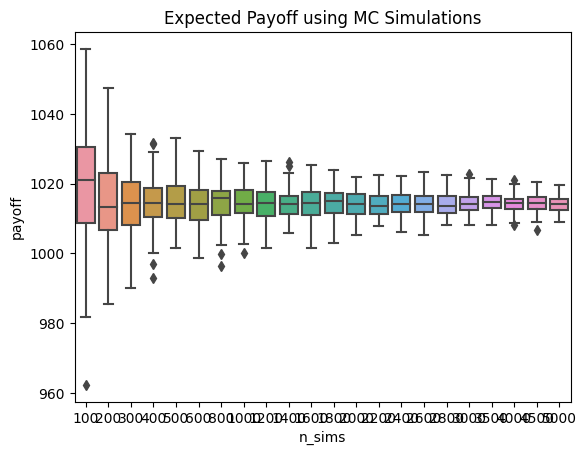

In [57]:
sns.boxplot(data=mc_var_df, x='n_sims', y='payoff')
plt.title('Expected Payoff using MC Simulations')
plt.show()

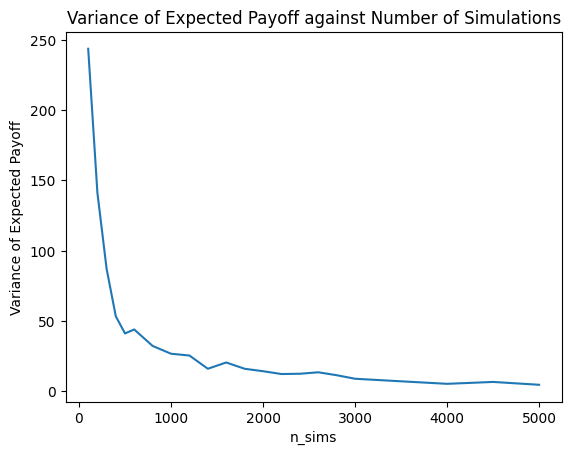

In [58]:
plt.plot(mc_var_df.groupby(by=['n_sims'])['payoff'].var())
plt.xlabel('n_sims')
plt.ylabel('Variance of Expected Payoff')
plt.title('Variance of Expected Payoff against Number of Simulations')
plt.show()

### Expected Payoff of AV Simulation

In [59]:
with open('../results/variance_reduction_experiment/av_var.json', 'r') as f:
    av_var = json.load(f)

In [60]:
av_var_dict = []

for n_sim in av_var.keys():
    values = av_var[n_sim]
    for val in values:
        av_var_dict.append({'n_sims': n_sim, 'payoff': val})

In [61]:
av_var_df = pd.DataFrame(av_var_dict)
av_var_df['n_sims'] = av_var_df['n_sims'].astype('int')
av_var_df.sort_values('n_sims',ascending=True,inplace=True)

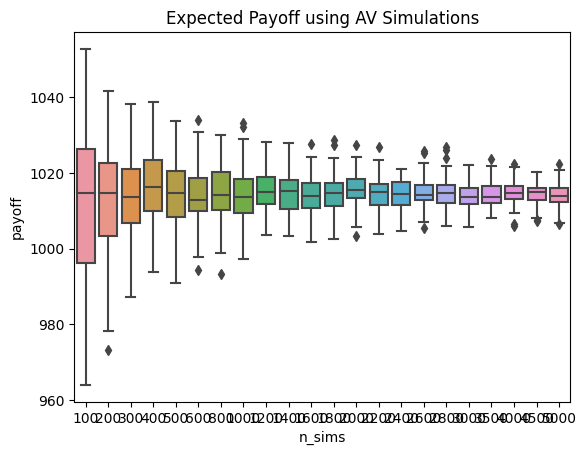

In [62]:
sns.boxplot(data=av_var_df, x='n_sims', y='payoff')
plt.title('Expected Payoff using AV Simulations')
plt.show()

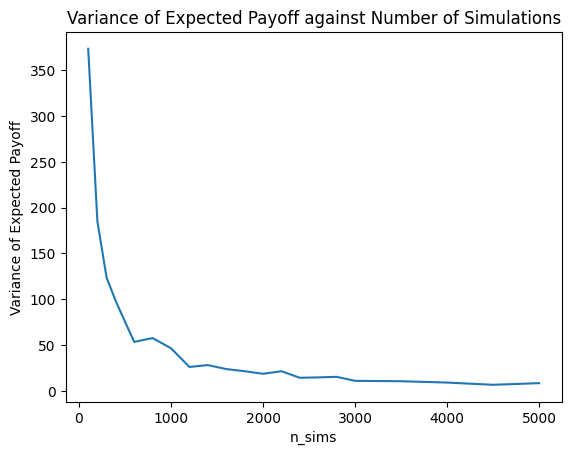

In [63]:
plt.plot(av_var_df.groupby(by=['n_sims'])['payoff'].var())
plt.xlabel('n_sims')
plt.ylabel('Variance of Expected Payoff')
plt.title('Variance of Expected Payoff against Number of Simulations')
plt.show()

### Variance of Expected Payoff of AV vs MC

In [64]:
av_var_df['technique'] = 'AV'
mc_var_df['technique'] = 'MC'
var_df = pd.concat([av_var_df, mc_var_df]).reset_index(drop=True)

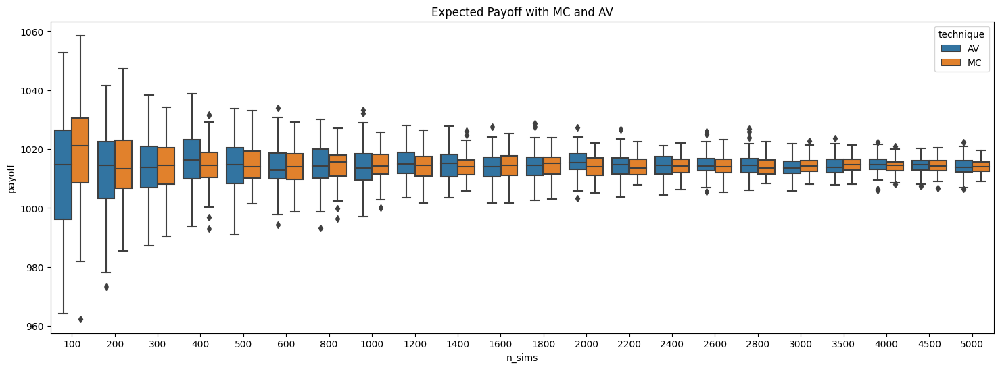

In [65]:
fig = plt.figure(figsize=(18,6))
sns.boxplot(data=var_df, x='n_sims', y='payoff', hue='technique')
plt.title('Expected Payoff with MC and AV')
plt.savefig('../results/MC_vs_AV_derivative_price_EMC')

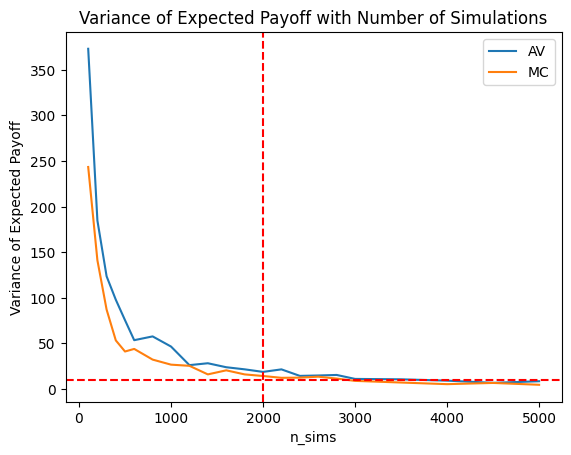

In [66]:
plt.plot(av_var_df.groupby(by=['n_sims'])['payoff'].var(), label='AV')
plt.plot(mc_var_df.groupby(by=['n_sims'])['payoff'].var(), label='MC')
plt.xlabel('n_sims')
plt.ylabel('Variance of Expected Payoff')
plt.title('Variance of Expected Payoff with Number of Simulations')
plt.legend(loc='upper right')
plt.axhline(10, color='red', linestyle='dashed')
plt.axvline(2000, color='red', linestyle='dashed')
plt.savefig('../results/MC_vs_AV_variance_derivative_price_EMC')

## AV Simulation vs MC Simulation

date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
988.1946968403907
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
979.3092343304395
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
960.8773892152586
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
974.5481435866474
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
979.0941354158114
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
983.8280017970593
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
957.9518630800783
trading_days_to_simulate: 247
De

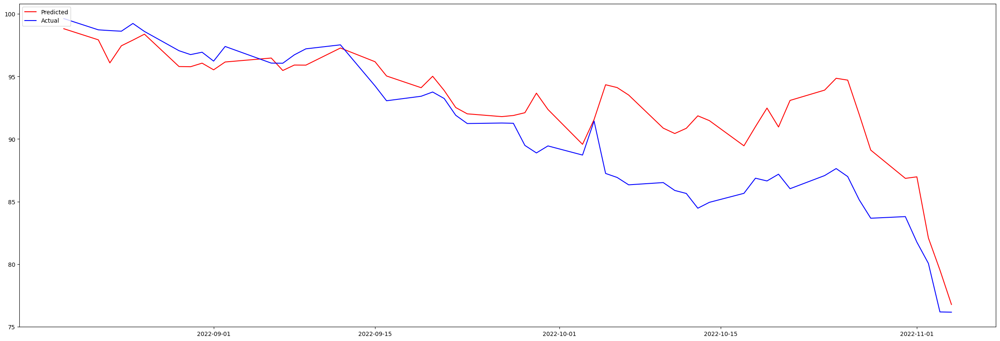

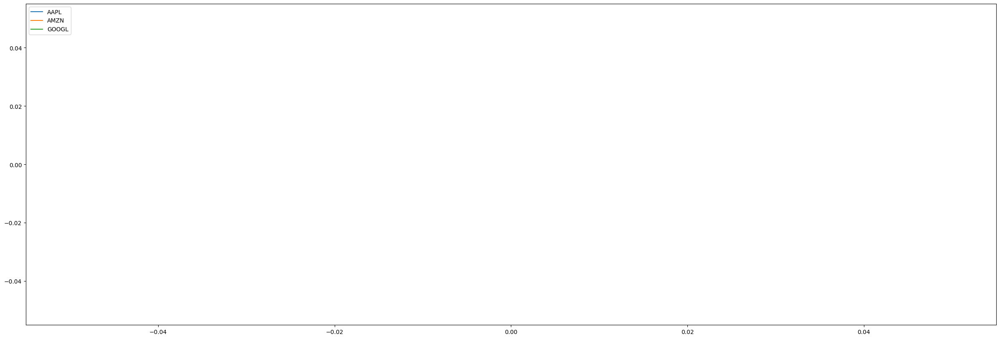

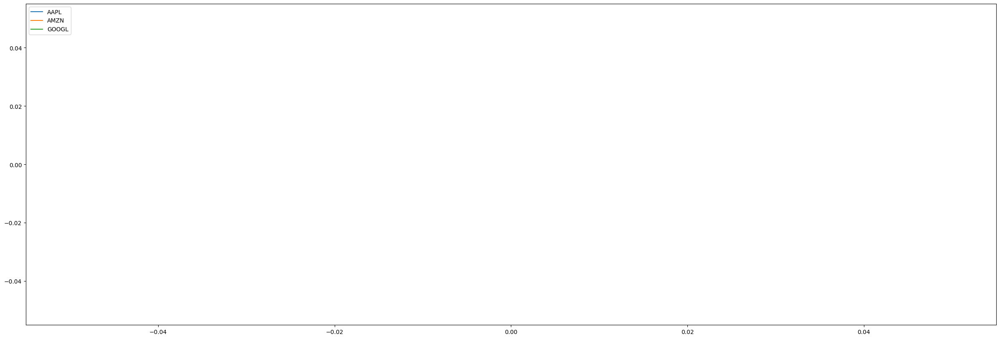

In [21]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 365,
    'latest_price_date': '2022-11-04',
    'variance_reduction': True,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':False,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':False,
    'delta_gamma': False,
    'h_prop': 0.001
}

results = calculate_derivative(experiment_details)
AV_EMS_price = results['sim_derivative']
av_googl = results['sim_googl']
Hist_Vol_price = results['sim_derivative']


## AV Simulation vs Standard MC Simulation

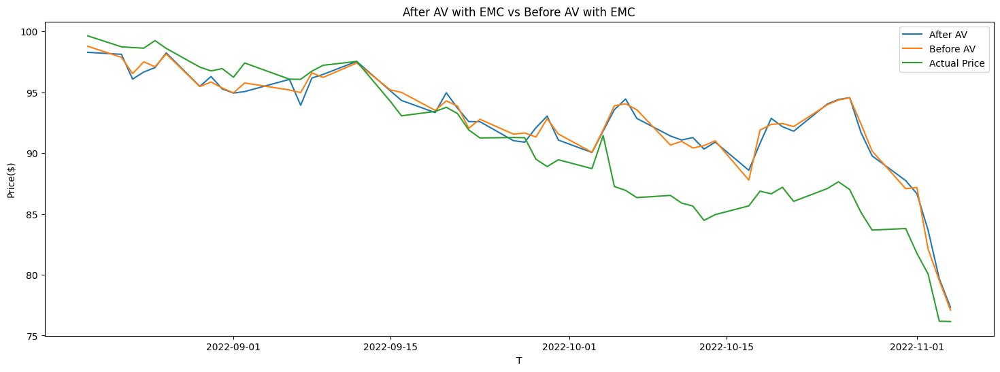

In [26]:
plt.figure(figsize=(18,6))
plt.title('After AV with EMC vs Before AV with EMC')
plt.plot(AV_EMS_price,label='After AV')
plt.plot(EMC_price,label='Before AV')
plt.plot(actual_price,label='Actual Price')
plt.legend(loc='upper right')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/AV_EMC')


## Visualising AV Simulated Paths

### Before AV

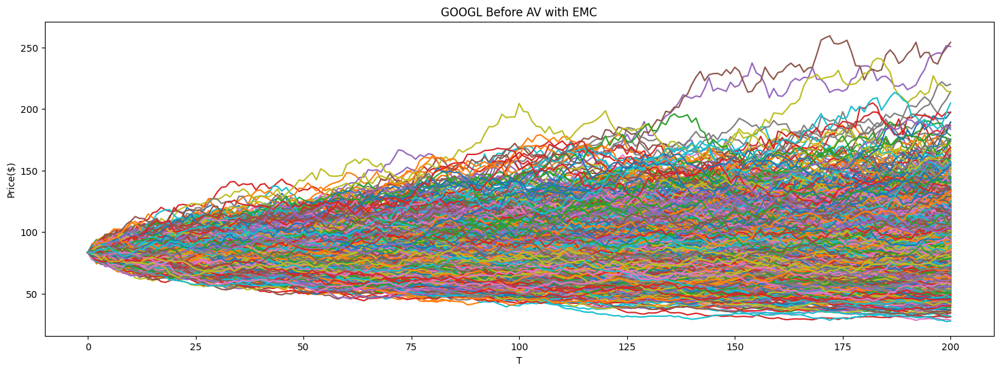

In [9]:
fig = plt.figure(figsize=(18,6))
for i in mc_googl:
    plt.plot(i)
plt.title('GOOGL Before AV with EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/GOOGL_MC_simulated_price')

### After AV

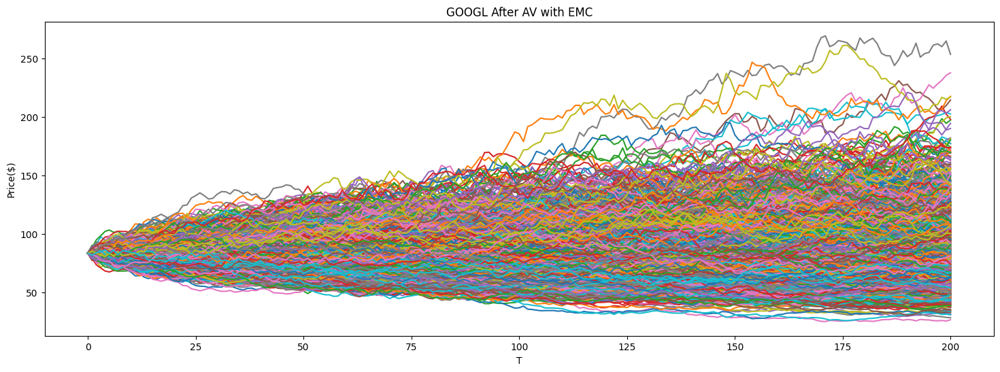

In [12]:
fig = plt.figure(figsize=(18,6))
for i in av_googl:
    plt.plot(i)
plt.title('GOOGL After AV with EMC')
plt.xlabel('T')
plt.ylabel('Price($)')
plt.savefig('../results/GOOGL_AV_simulated_price')

# Implied Volatility

In [ ]:
## Saving historical volatility into dataframe
aapl_HV = results['sigma_aapl']
amzn_HV = results['sigma_amzn']
googl_HV = results['sigma_googl']
dates = results['prediction_dates']
hist_vol_df = pd.DataFrame()
hist_vol_df['AAPL_Vol'] = aapl_HV
hist_vol_df['AMZN_Vol'] = amzn_HV
hist_vol_df['GOOGL_Vol'] = googl_HV
hist_vol_df['Type'] = 'Historical Volatility'

In [ ]:
## Saving estimated implied volatility into dataframe
aapl_EIV = results['sigma_aapl']
amzn_EIV = results['sigma_amzn']
googl_EIV = results['sigma_googl']

estimated_IV_df = pd.DataFrame()
estimated_IV_df['AAPL_Vol'] = aapl_EIV
estimated_IV_df['AMZN_Vol'] = amzn_EIV
estimated_IV_df['GOOGL_Vol'] = googl_EIV
estimated_IV_df['Type'] = 'Estimated IV'

In [ ]:
## Saving actual implied volatility into dataframe
aapl_AIV = results['sigma_aapl']
amzn_AIV = results['sigma_amzn']
googl_AIV = results['sigma_googl']

actual_IV_df = pd.DataFrame()
actual_IV_df['AAPL_Vol'] = aapl_AIV
actual_IV_df['AMZN_Vol'] = amzn_AIV
actual_IV_df['GOOGL_Vol'] = googl_AIV
actual_IV_df['Type'] = 'Actual IV'

#Merging all the dataframe
pdList = [hist_vol_df,estimated_IV_df,actual_IV_df]
merged_vol_df = pd.DataFrame(columns=['AAPL_Vol','AMZN_Vol','GOOGL_Vol','Date'])
merged_vol_df = pd.concat(pdList,axis=0)
temp = merged_vol_df.copy()
temp['AAPL_Vol'] = temp['AAPL_Vol'].astype('float')
temp['AMZN_Vol'] = temp['AMZN_Vol'].astype('float')
temp['GOOGL_Vol'] = temp['GOOGL_Vol'].astype('float')

## AAPL Volatility Plot

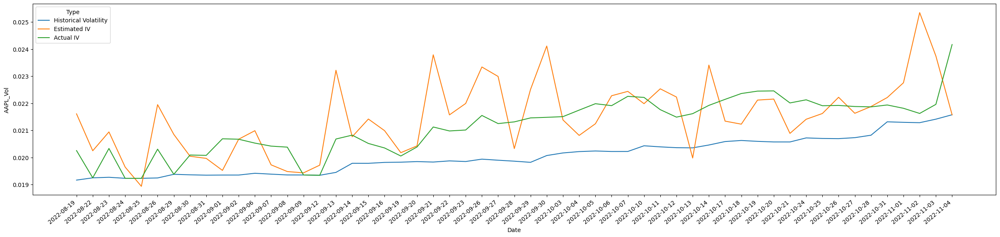

In [ ]:
import seaborn as sns
fig= plt.figure(figsize=(30,6))

ax = sns.lineplot(x='Date',y='AAPL_Vol',data=temp,hue='Type')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.savefig('../results/AAPL_Vol')

## AMZN Volatility Plot

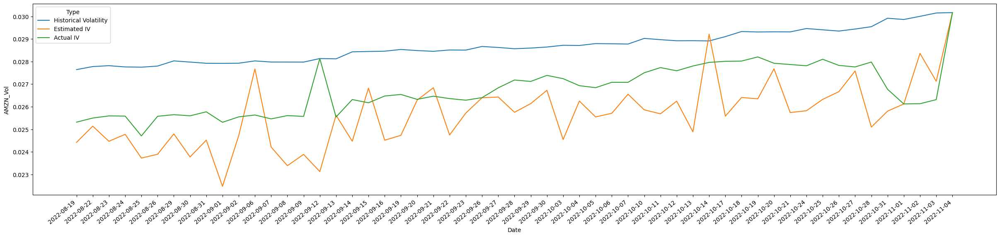

In [ ]:
fig= plt.figure(figsize=(30,6))

ax = sns.lineplot(x='Date',y='AMZN_Vol',data=temp,hue='Type')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.savefig('../results/AMZN_Vol')



## GOOGL Volatility Plot

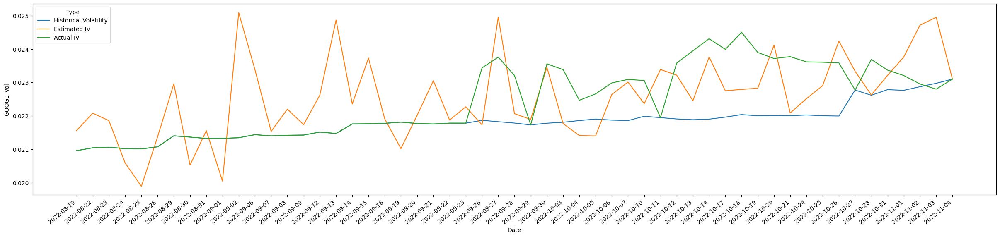

In [ ]:
fig= plt.figure(figsize=(30,6))

ax = sns.lineplot(x='Date',y='GOOGL_Vol',data=temp,hue='Type')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")

plt.savefig('../results/GOOGL_Vol')


## Simulation with Estimated Implied Volatility

date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
986.6660509485656
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
976.7773180674869
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
970.8770228816273
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
968.6179506685141
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
971.3155450063459
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
969.8440307188527
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
963.0423561833901
trading_days_to_simulate: 247
De

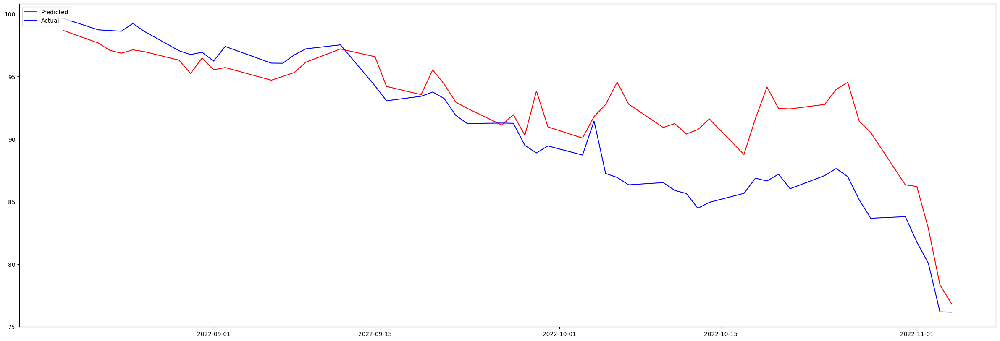

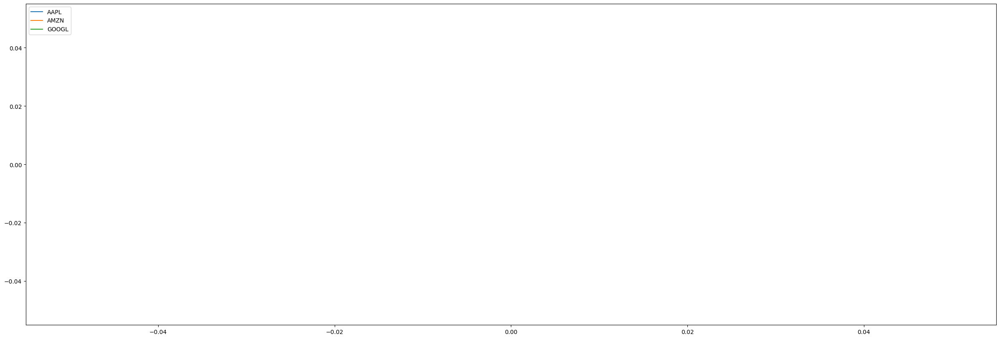

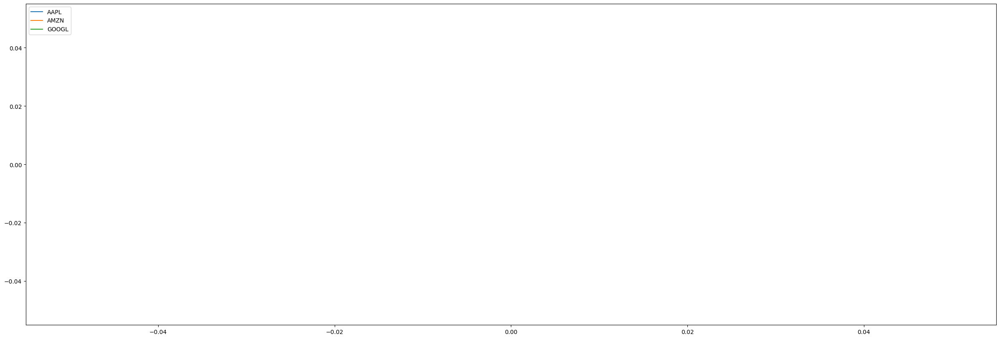

In [46]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 365,
    'latest_price_date': '2022-11-04',
    'variance_reduction': True,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':False,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':False,
    'delta_gamma': False,
    'h_prop': 0.001
}
results = calculate_derivative(experiment_details)
EIV_price = results['sim_derivative']
actual_derivative = results['actual_derivative']

## Estimated Implied Volatility vs Historical Volatility

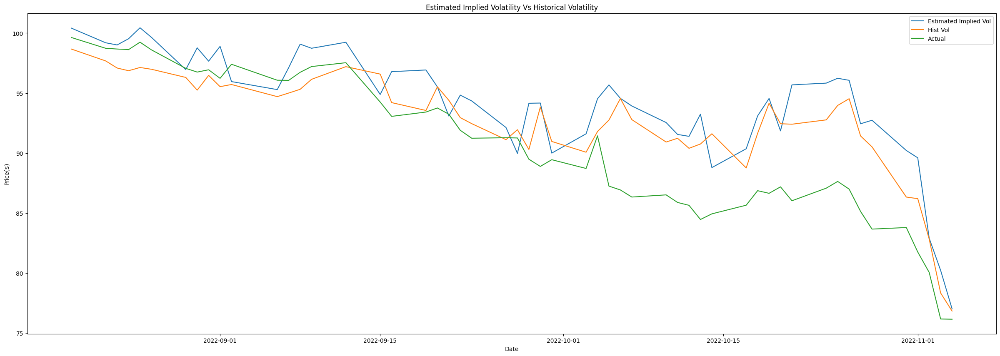

In [48]:
fig = plt.figure(figsize=(30,10))
plt.plot(EIV_price, label='Estimated Implied Vol')
plt.plot(Hist_Vol_price, label='Hist Vol')
plt.plot(actual_derivative, label='Actual')
plt.xlabel('Date')
plt.ylabel('Price($)')
plt.legend(loc='upper right')
plt.title('Estimated Implied Volatility Vs Historical Volatility')
plt.savefig('../results/EIV_vs_HV')

## Simulation with Actual Implied Volatitlity

date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
1005.9561523901382
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
995.0467378164213
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
986.9730609438071
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
988.7979351838937
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
989.2813099561316
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
995.6900271153308
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
970.4061304645322
trading_days_to_simulate: 247
D

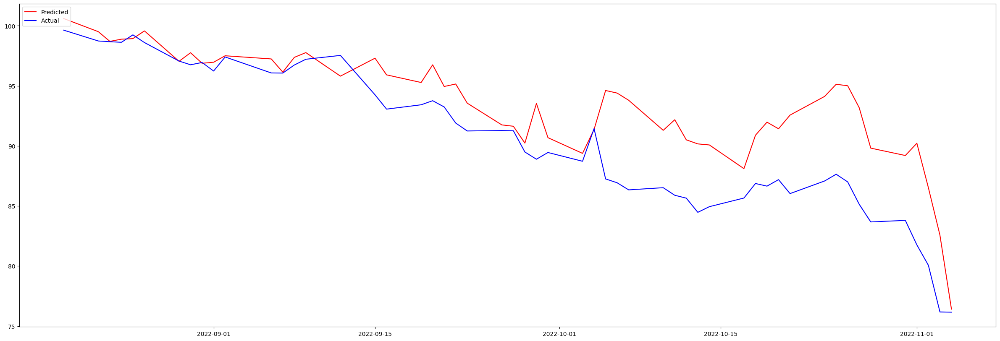

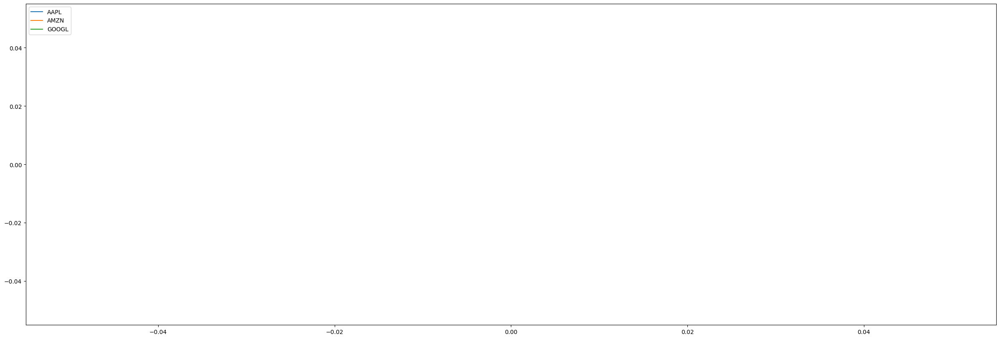

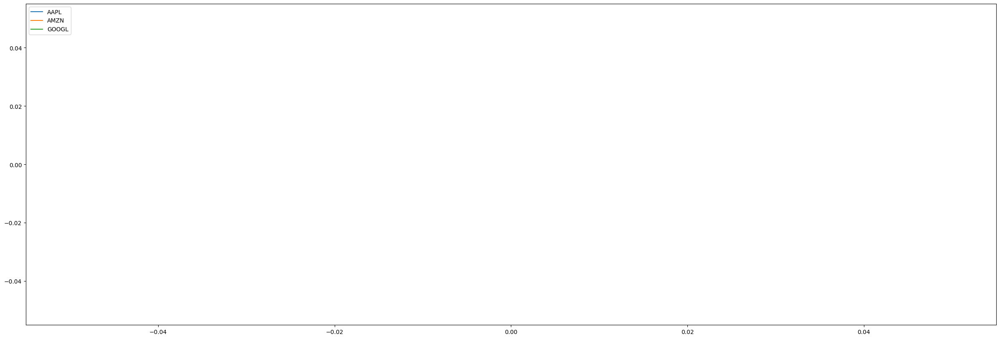

In [49]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 365,
    'latest_price_date': '2022-11-04',
    'variance_reduction': True,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':True,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':False,
    'delta_gamma': False,
    'h_prop': 0.001
}
results = calculate_derivative(experiment_details)

## Actual Implied Volatility vs Historical Volatility

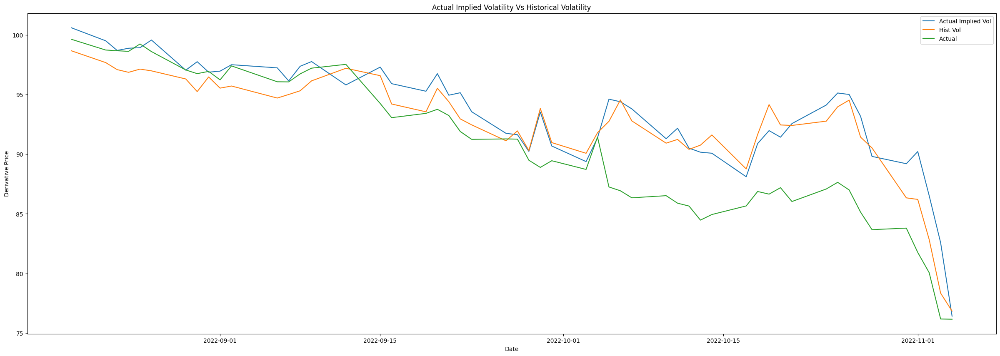

In [50]:
AIV_price = results['sim_derivative']
fig = plt.figure(figsize=(30,10))
plt.plot(AIV_price, label='Actual Implied Vol')
plt.plot(Hist_Vol_price, label='Hist Vol')
plt.plot(actual_derivative, label='Actual')
plt.xlabel('Date')
plt.ylabel('Derivative Price')
plt.legend(loc='upper right')
plt.title('Actual Implied Volatility Vs Historical Volatility')
plt.savefig('../results/AIV_vs_HV')

# Varying Interest Rate

## Trend of Interest Rate

In [ ]:
rates = pd.read_csv('../data/USTREASURY-YIELD_01_11_22.csv')
rates['Date'] = pd.to_datetime(rates['Date'],format='%Y-%m-%d')
rates = rates.set_index('Date')
rates = rates.asfreq('D')
rates = rates.ffill()

fig = plt.figure(figsize=(12,6))
plt.plot(rates.loc['2022-08-19':, '1 YR'])
plt.xlabel('Date')
plt.ylabel('Interest Rates (%)')
plt.title('1 YR Interest Rates')
plt.savefig('../results/1YR_interest_rates')

## Varying Interest Rate vs Constant Interest Rate

date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
990.1927736224015
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
981.5274264079875
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
970.9443288893649
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
961.9620739337878
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
969.3583671410923
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
979.540637495064
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
959.6819080476165
trading_days_to_simulate: 247
Der

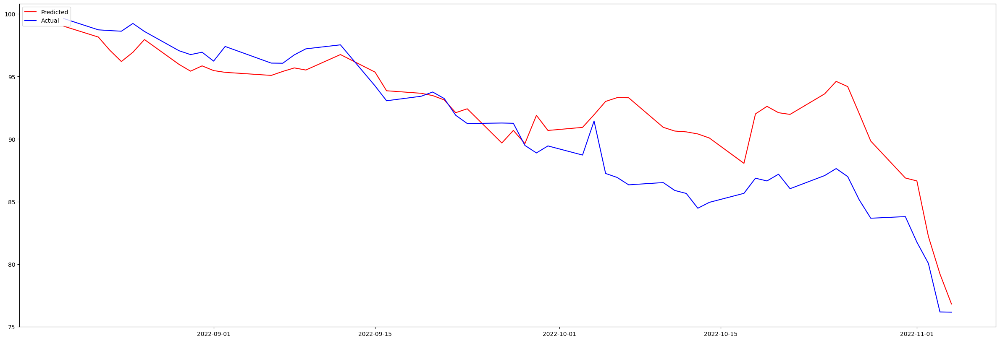

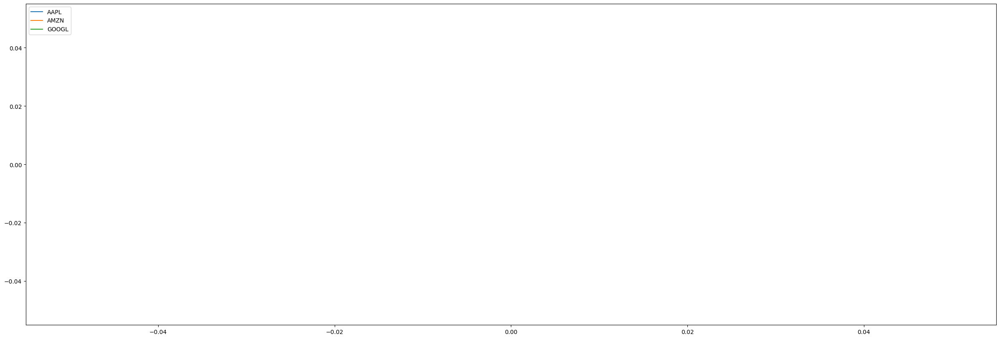

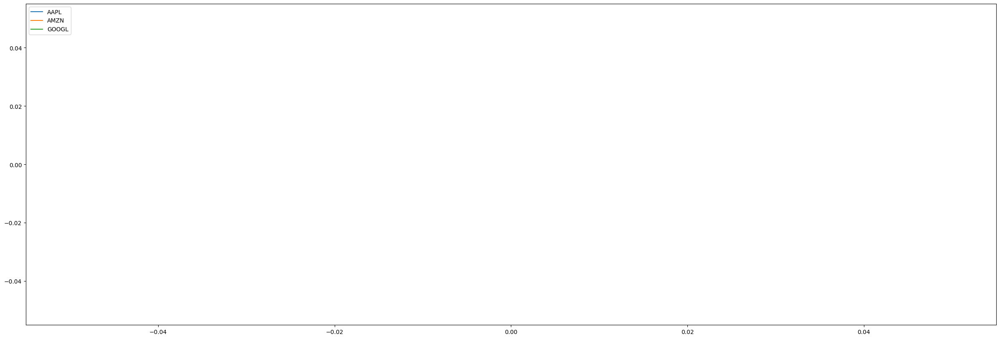

In [24]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 365,
    'latest_price_date': '2022-11-04',
    'variance_reduction': True,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    # 'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':False,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':False,
    'delta_gamma': False,
    'h_prop': 0.001
}
results = calculate_derivative(experiment_details)
varying_r_price = results['sim_derivative']
actual_derivative = results['actual_derivative']

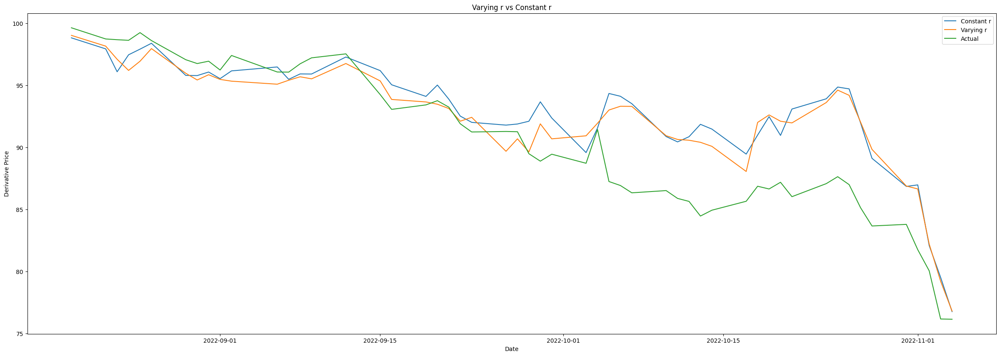

In [25]:
fig = plt.figure(figsize=(30,10))
plt.plot(AV_EMS_price, label='Constant r')
plt.plot(varying_r_price, label='Varying r')
plt.plot(actual_derivative, label='Actual')
plt.xlabel('Date')
plt.ylabel('Derivative Price')
plt.legend(loc='upper right')
plt.title('Varying r vs Constant r')
plt.savefig('../results/Varying_vs_Constant_r')

## Interpolating Interest Rate

date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
983.8670572141119
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
987.9845803302585
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
968.0309736306181
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
966.2548530011618
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
977.0858268163672
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
975.8492724338516
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
956.9205636584801
trading_days_to_simulate: 247
De

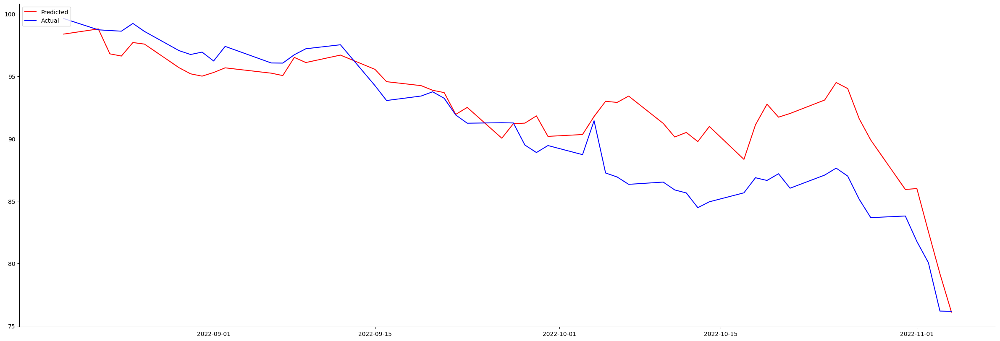

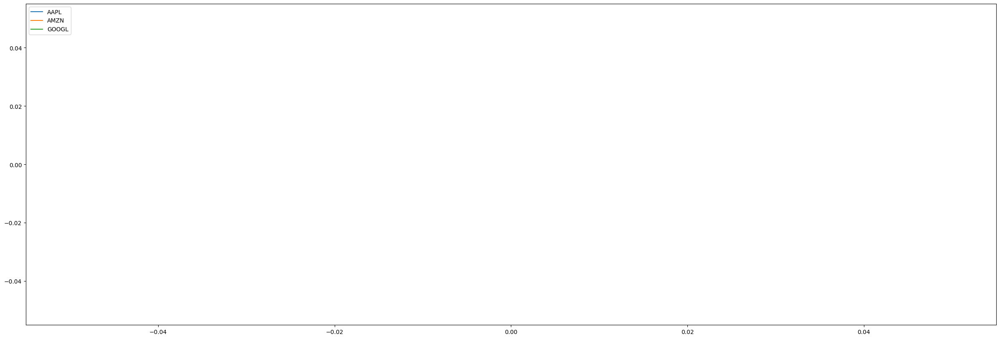

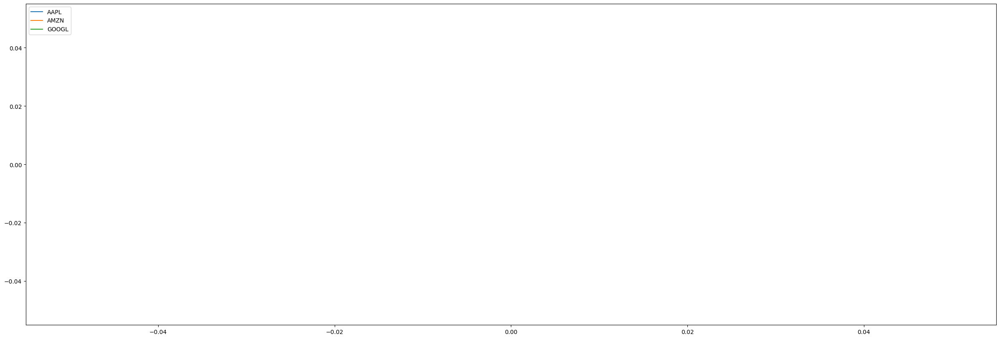

In [29]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 365,
    'latest_price_date': '2022-11-04',
    'variance_reduction': True,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    # 'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':False,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':True,
    'delta_gamma': False,
    'h_prop': 0.001
}
results = calculate_derivative(experiment_details)
interpolated_r_price = results['sim_derivative']

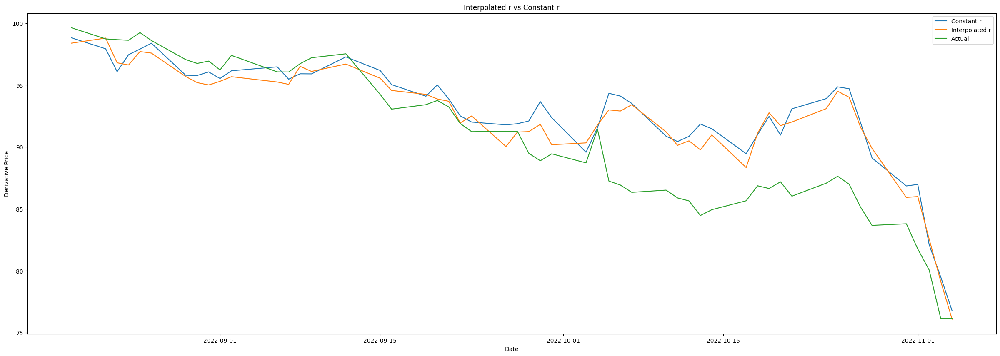

In [30]:
fig = plt.figure(figsize=(30,10))
plt.plot(AV_EMS_price, label='Constant r')
plt.plot(interpolated_r_price, label='Interpolated r')
plt.plot(actual_derivative, label='Actual')
plt.xlabel('Date')
plt.ylabel('Derivative Price')
plt.legend(loc='upper right')
plt.title('Interpolated r vs Constant r')
plt.savefig('../results/Interpolated_r_vs_Constant_r')

# Reducing Rolling Window

date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
964.5859800849182
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
954.4749026910896
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
942.619127253462
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
949.499159470979
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
948.7181226705554
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
960.0678478576767
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
945.5157532492018
trading_days_to_simulate: 247
Deri

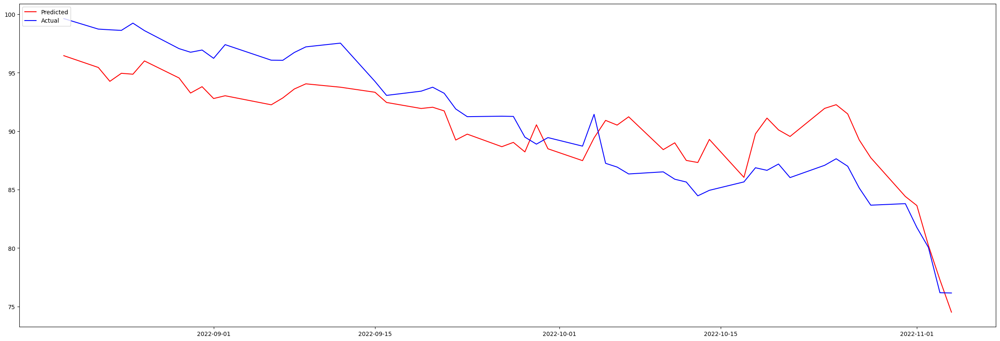

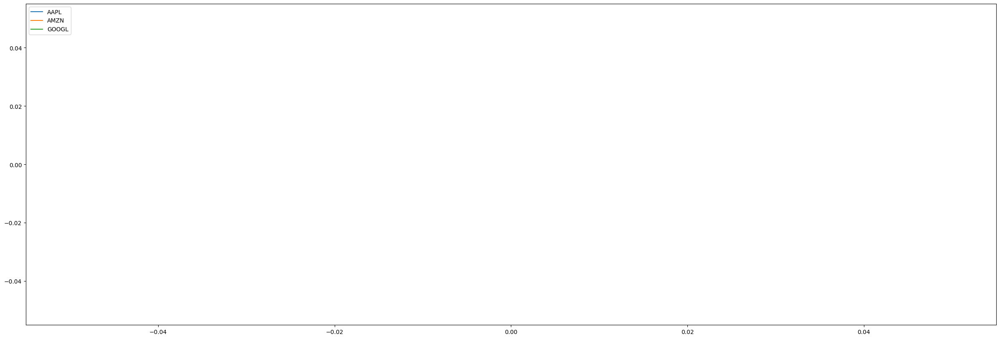

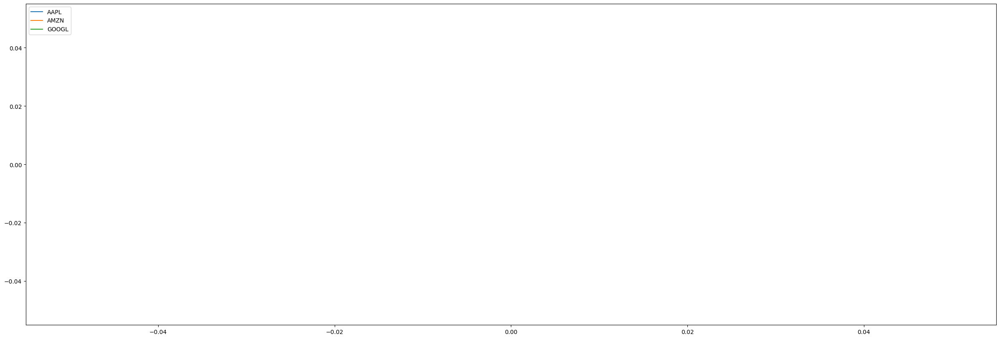

In [26]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 300,
    'latest_price_date': '2022-11-04',
    'variance_reduction': True,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    # 'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':False,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':False,
    'delta_gamma': False,
    'h_prop': 0.001
}
results = calculate_derivative(experiment_details)
reduced_rolling_window_price = results['sim_derivative']
actual_derivative = results['actual_derivative']

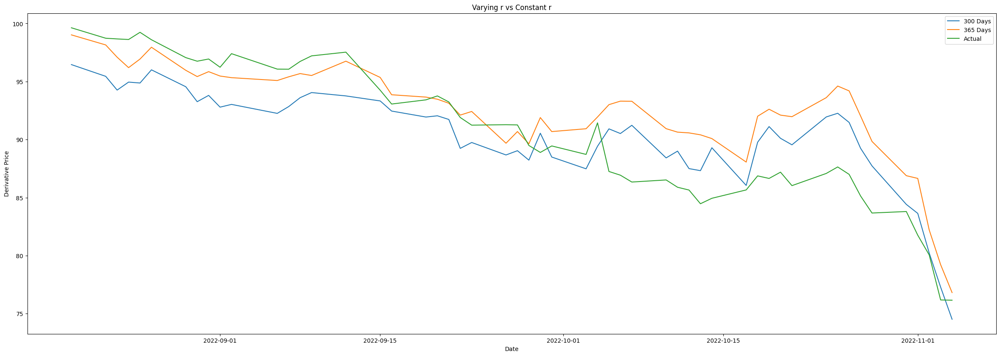

In [27]:
fig = plt.figure(figsize=(30,10))
plt.plot(reduced_rolling_window_price, label='300 Days')
plt.plot(varying_r_price, label='365 Days')
plt.plot(actual_derivative, label='Actual')
plt.xlabel('Date')
plt.ylabel('Derivative Price')
plt.legend(loc='upper right')
plt.title('Varying r vs Constant r')
plt.savefig('../results/reducing_rolling_window')

# Sensitivities

## Delta & Gamma (Historical Volatility)

date_to_predict: 2022-08-19 00:00:00
hist_end: 2022-08-18 00:00:00
end_date: 2022-11-04 00:00:00
q2_to_maturity: 127
q3_to_maturity: 65
q2: 2023-02-20 00:00:00
q3: 2023-05-19 00:00:00
total_trading_days: 254
holidays: ['2022-09-05', '2022-11-24', '2022-12-26', '2023-01-01', '2023-01-16', '2023-02-20', '2023-04-07', '2023-05-29', '2023-07-04']
trading_days_to_simulate: 254
Derivative Price for 2022-08-19 00:00:00
995.8963372660503
trading_days_to_simulate: 253
Derivative Price for 2022-08-22 00:00:00
987.4409097629219
trading_days_to_simulate: 252
Derivative Price for 2022-08-23 00:00:00
965.2072296284873
trading_days_to_simulate: 251
Derivative Price for 2022-08-24 00:00:00
970.4323202884716
trading_days_to_simulate: 250
Derivative Price for 2022-08-25 00:00:00
972.0714192471385
trading_days_to_simulate: 249
Derivative Price for 2022-08-26 00:00:00
987.0772951902801
trading_days_to_simulate: 248
Derivative Price for 2022-08-29 00:00:00
959.9624612580699
trading_days_to_simulate: 247
De

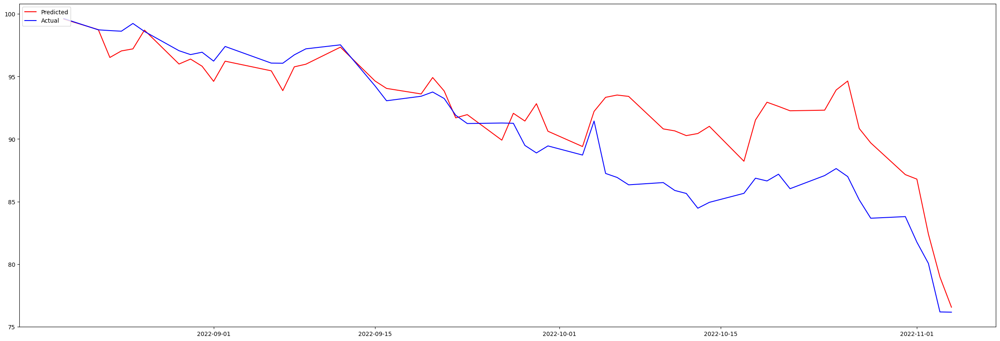

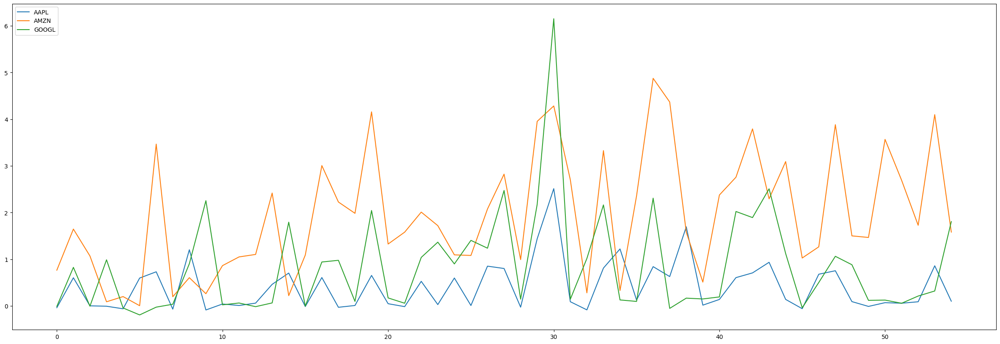

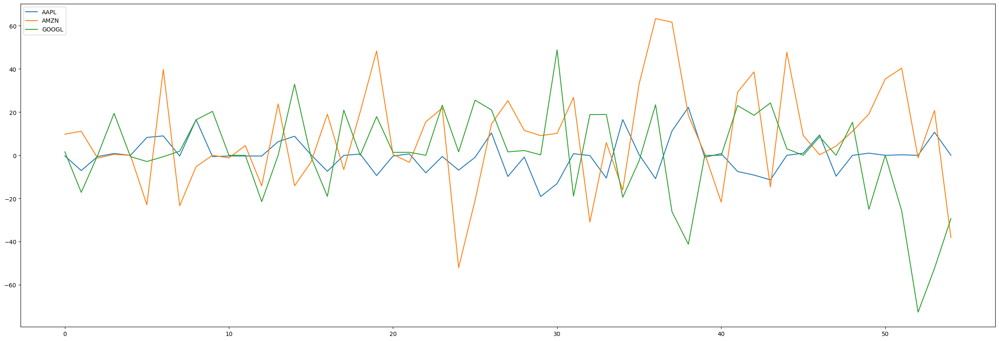

In [67]:
experiment_details = {
    'Nsim': 2000,
    'window_length': 365,
    'latest_price_date': '2022-11-04',
    'variance_reduction': True,
    'GBM': 'multivariate',
    # Remove 'r' to use varying interest rates
    # 'r': 0.0326,
    ## If set to true uses estimated IV calculated from BS Pricing formula
    'estimated_IV': False,
    ## If set to true uses IV data extracted from bloomberg
    'actual_IV':False,
    'min_sigma':0,
    'max_sigma':5,
    'step':0.000001,
    'EMS': True,
    # Set to True to interpolate interest rates, else will use 1 YR r on that day
    'interpolate_r':True,
    'delta_gamma': True,
    'h_prop': 0.001
}
results = calculate_derivative(experiment_details)
reduced_rolling_window_price = results['sim_derivative']
actual_derivative = results['actual_derivative']